In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import openpyxl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from variables import country_Orig

In [2]:
city="ams"
base_dir = os.path.dirname(os.path.dirname(os.path.dirname(os.path.abspath("__file__"))))
print(base_dir)
# Paths for the Population Data --------------------------------------------------------------
#path to ancillary data folder
ancillary_data_folder_path = base_dir + "/data_prep/{}_Projectdata/AncillaryData".format(city)
ancillary_POPdata_folder_path = base_dir + "/data_prep/{}_Projectdata/PopData".format(city)
cor_path= base_dir + "/data_prep/{}_data_scripts_pop/correlations/corImages".format(city)
image_path= base_dir + "/data_prep/{}_Projectdata/PopData/images".format(city)
years_list=[1992,1994,1996,1998,2000,2002,2004,2006,2008,2010,2012,2014,2016,2018] #

c:\Users\NM12LQ\OneDrive - Aalborg Universitet\PopNetV2


In [3]:
year=1992
df = gpd.read_file(ancillary_POPdata_folder_path + '/{0}/temp_shp/{0}_dataVectorGrid.geojson'.format(year))

In [4]:
#Remove the standard columns from the unique Attributes and write file
select = [ 'Oceania', 'EuropeNotEU', 'EuropeEUnoLocal',  'Central_Asia', 'Eastern_Asia', 'Southern-Eastern_Asia', 'Southern_Asia', 
'Western_Asia', 'Northern_America', 'Latin_America_and_the_Caribbean', 'Northern_Africa', 'Sub-Saharan_Africa', 'Others', 'Colonies']

In [5]:
df['totalMig'] =df['l1_totalpop']-df['nld']
for i in select:
    df['Z0_{}'.format(i)] = (df['{}'.format(i)]/df['l1_totalpop'])*100 #totalPop
    df['Z1_{}'.format(i)] = (df['{}'.format(i)]/df['totalMig'])*100 #totalMig
df.to_file(ancillary_POPdata_folder_path + "/{0}/temp_shp/{0}_dataVectorGridDivs.geojson".format(year),driver='GeoJSON',crs="EPSG:3035")

Oceania ['aus', 'cxr', 'cck', 'hmd', 'nzl', 'nfk', 'fji', 'png', 'slb', 'vut', 'ncl', 'gum', 'kir', 'mhl', 'fsm', 'nru', 'mnp', 'plw', 'umi', 'asm', 'cok', 'pyf', 'niu', 'pcn', 'wsm', 'tkl', 'ton', 'tuv', 'wlf']
['asm', 'aus', 'png', 'fji', 'pyf', 'gum', 'ncl', 'nzl', 'slb', 'vut']


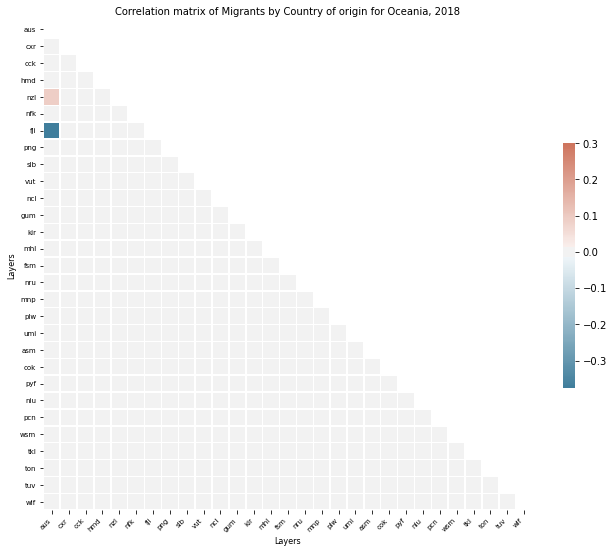

Australia ['aus', 'cxr', 'cck', 'hmd', 'nzl', 'nfk']
['aus', 'nzl']


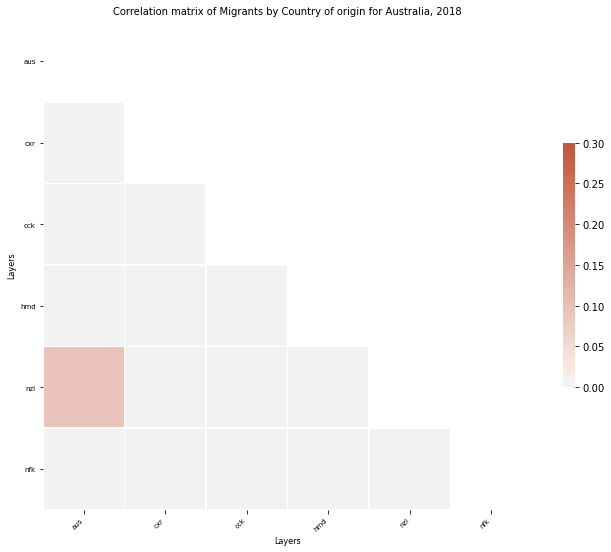

Malanesia ['fji', 'png', 'slb', 'vut', 'ncl']
['png', 'fji', 'ncl', 'slb', 'vut']


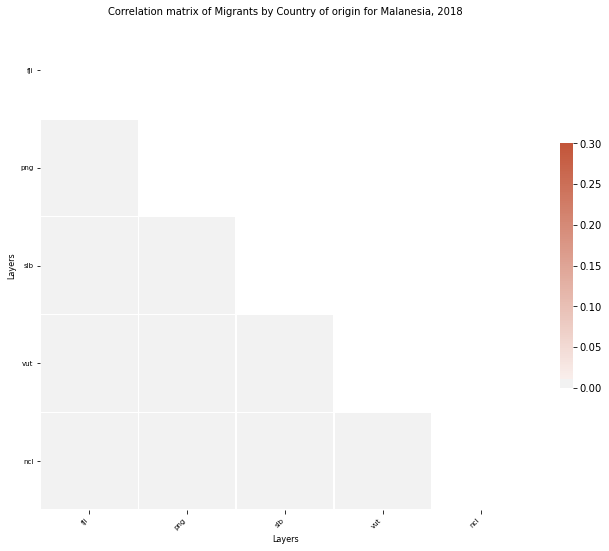

Micronesia ['gum', 'kir', 'mhl', 'fsm', 'nru', 'mnp', 'plw', 'umi']
['gum']


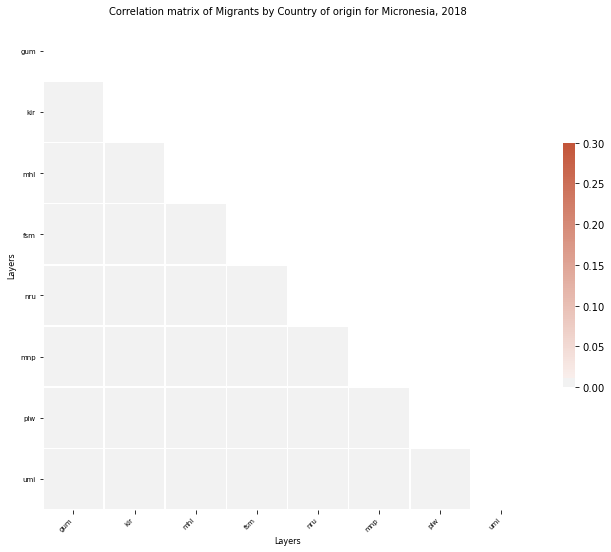

Polynesia ['asm', 'cok', 'pyf', 'niu', 'pcn', 'wsm', 'tkl', 'ton', 'tuv', 'wlf']
['asm', 'pyf']


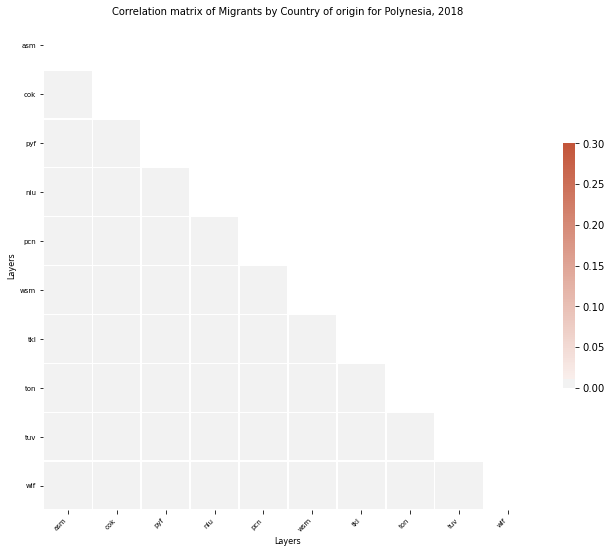

Europe ['pol', 'blr', 'bgr', 'cze', 'hun', 'mda', 'rou', 'rus', 'svk', 'ukr', 'bih', 'mkd', 'alb', 'and', 'hrv', 'gib', 'grc', 'vat', 'mlt', 'mne', 'prt', 'ita', 'smr', 'srb', 'svn', 'esp', 'deu', 'nld', 'aut', 'bel', 'fra', 'lie', 'lux', 'mco', 'che', 'gbr', 'nor', 'irl', 'swe', 'lva', 'est', 'isl', 'sjm', 'fro', 'fin', 'jey', 'imn', 'ltu', 'ggy', 'ala', 'dnk']
['alb', 'and', 'blr', 'bel', 'bih', 'bgr', 'dnk', 'est', 'fro', 'fin', 'fra', 'gib', 'grc', 'gbr', 'hun', 'irl', 'isl', 'ita', 'ggy', 'hrv', 'lva', 'ltu', 'lux', 'mkd', 'mlt', 'imn', 'mda', 'mco', 'nld', 'nor', 'ukr', 'aut', 'pol', 'prt', 'rou', 'srb', 'svn', 'svk', 'cze', 'swe', 'che', 'deu', 'esp', 'rus']


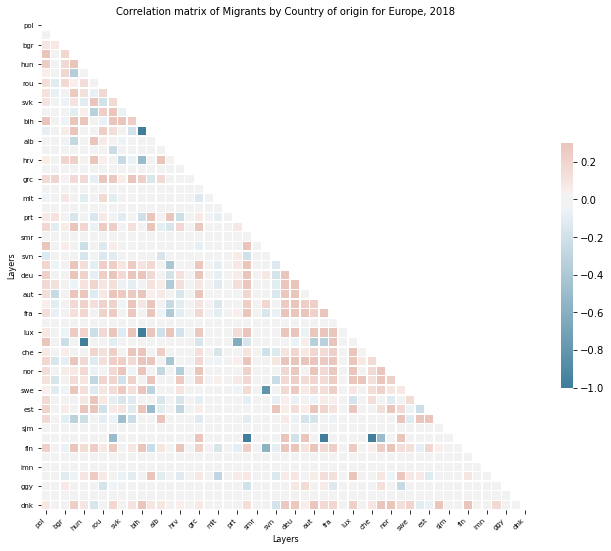

EuropenoLocal ['pol', 'blr', 'bgr', 'cze', 'hun', 'mda', 'rou', 'rus', 'svk', 'ukr', 'bih', 'mkd', 'alb', 'and', 'hrv', 'gib', 'grc', 'vat', 'mlt', 'mne', 'prt', 'ita', 'smr', 'srb', 'svn', 'esp', 'deu', 'aut', 'bel', 'fra', 'lie', 'lux', 'mco', 'che', 'gbr', 'nor', 'irl', 'swe', 'lva', 'est', 'isl', 'sjm', 'fro', 'fin', 'jey', 'imn', 'ltu', 'ggy', 'ala', 'dnk']
['alb', 'and', 'blr', 'bel', 'bih', 'bgr', 'dnk', 'est', 'fro', 'fin', 'fra', 'gib', 'grc', 'gbr', 'hun', 'irl', 'isl', 'ita', 'ggy', 'hrv', 'lva', 'ltu', 'lux', 'mkd', 'mlt', 'imn', 'mda', 'mco', 'nor', 'ukr', 'aut', 'pol', 'prt', 'rou', 'srb', 'svn', 'svk', 'cze', 'swe', 'che', 'deu', 'esp', 'rus']


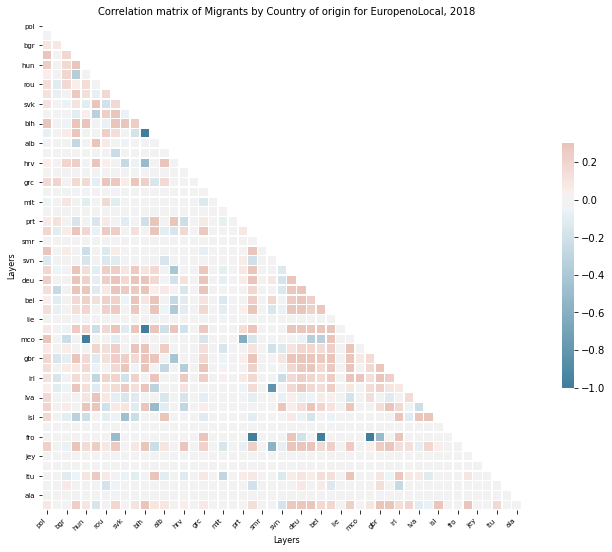

Eastern_Europe ['pol', 'blr', 'bgr', 'cze', 'hun', 'mda', 'rou', 'rus', 'svk', 'ukr']
['blr', 'bgr', 'hun', 'mda', 'ukr', 'pol', 'rou', 'svk', 'cze', 'rus']


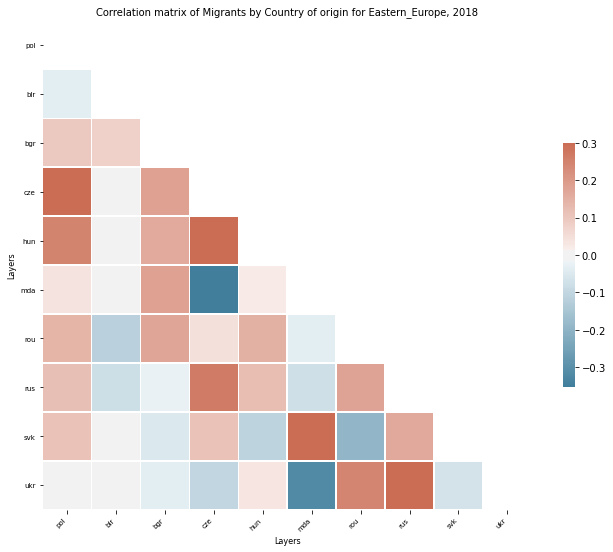

Southern_Europe ['bih', 'mkd', 'alb', 'and', 'hrv', 'gib', 'grc', 'vat', 'mlt', 'mne', 'prt', 'ita', 'smr', 'srb', 'svn', 'esp']
['alb', 'and', 'bih', 'gib', 'grc', 'ita', 'hrv', 'mkd', 'mlt', 'prt', 'srb', 'svn', 'esp']


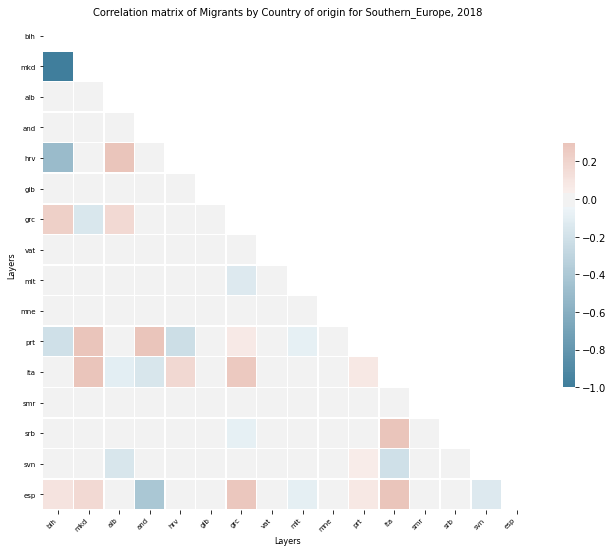

Western_Europe ['deu', 'nld', 'aut', 'bel', 'fra', 'lie', 'lux', 'mco', 'che']
['bel', 'fra', 'lux', 'mco', 'nld', 'aut', 'che', 'deu']


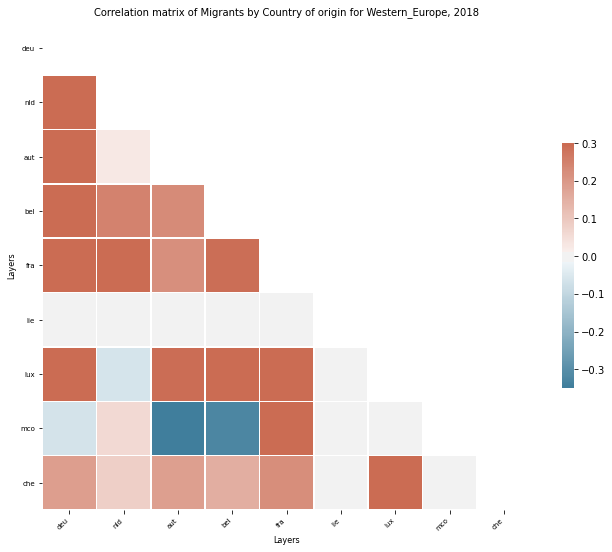

Western_EuropenoLocal ['deu', 'aut', 'bel', 'fra', 'lie', 'lux', 'mco', 'che']
['bel', 'fra', 'lux', 'mco', 'aut', 'che', 'deu']


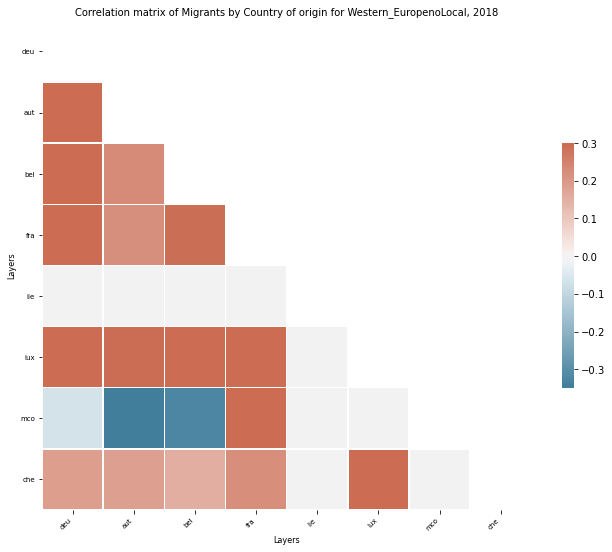

Northern_Europe ['gbr', 'nor', 'irl', 'swe', 'lva', 'est', 'isl', 'sjm', 'fro', 'fin', 'jey', 'imn', 'ltu', 'ggy', 'ala', 'dnk']
['dnk', 'est', 'fro', 'fin', 'gbr', 'irl', 'isl', 'ggy', 'lva', 'ltu', 'imn', 'nor', 'swe']


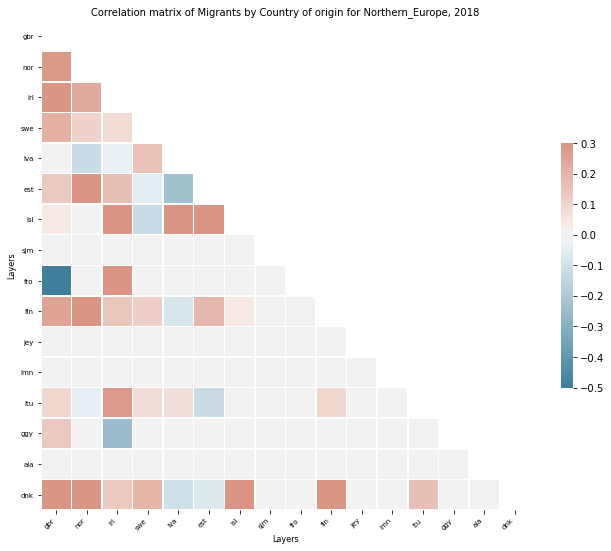

EuropeEU ['lie', 'nor', 'isl', 'che', 'gbr', 'bgr', 'cze', 'hun', 'rou', 'svk', 'dnk', 'est', 'fin', 'irl', 'cypswe', 'lva', 'hrv', 'grc', 'ita', 'mlt', 'prt', 'svn', 'esp', 'aut', 'bel', 'fra', 'deu', 'lux', 'mco', 'nld', 'pol']
['bel', 'bgr', 'dnk', 'est', 'fin', 'fra', 'grc', 'gbr', 'hun', 'irl', 'isl', 'ita', 'hrv', 'lva', 'lux', 'mlt', 'mco', 'nld', 'nor', 'aut', 'pol', 'prt', 'rou', 'svn', 'svk', 'cze', 'che', 'deu', 'esp']


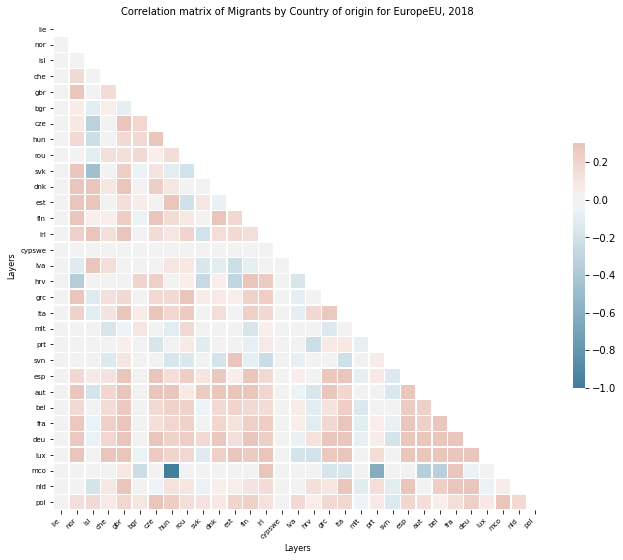

EuropeNotEU ['blr', 'mda', 'rus', 'ukr', 'ala', 'ggy', 'jey', 'fro', 'imn', 'sjm', 'alb', 'and', 'bih', 'gib', 'vat', 'mne', 'mkd', 'smr', 'srb']
['alb', 'and', 'blr', 'bih', 'fro', 'gib', 'ggy', 'mkd', 'imn', 'mda', 'ukr', 'srb', 'rus']


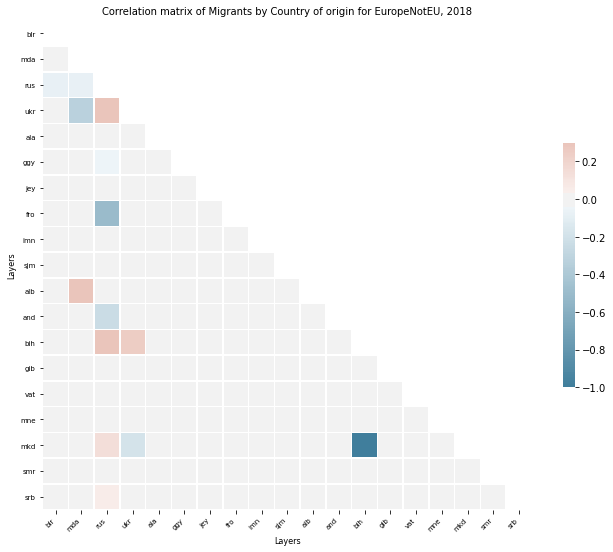

EuropeEUnoLocal ['lie', 'nor', 'isl', 'che', 'gbr', 'bgr', 'cze', 'hun', 'rou', 'svk', 'dnk', 'est', 'fin', 'irl', 'cypswe', 'lva', 'hrv', 'grc', 'ita', 'mlt', 'prt', 'svn', 'esp', 'aut', 'bel', 'fra', 'deu', 'lux', 'mco']
['bel', 'bgr', 'dnk', 'est', 'fin', 'fra', 'grc', 'gbr', 'hun', 'irl', 'isl', 'ita', 'hrv', 'lva', 'lux', 'mlt', 'mco', 'nor', 'aut', 'prt', 'rou', 'svn', 'svk', 'cze', 'che', 'deu', 'esp']


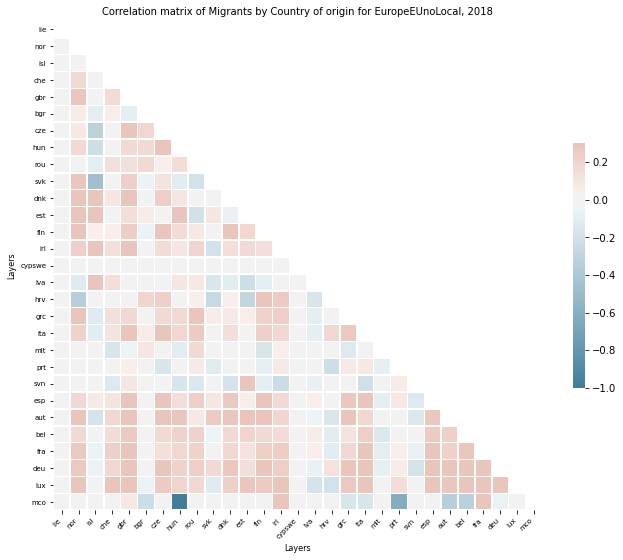

Asia ['kaz', 'kgz', 'tjk', 'tkm', 'uzb', 'chn', 'hkg', 'mac', 'prk', 'jpn', 'mng', 'kor', 'phl', 'vnm', 'brn', 'khm', 'idn', 'lao', 'mys', 'mmr', 'sgp', 'tha', 'tls', 'afg', 'ind', 'irn', 'pak', 'bgd', 'btn', 'npl', 'mdv', 'lka', 'arm', 'aze', 'bhr', 'geo', 'irq', 'isr', 'jor', 'kwt', 'lbn', 'omn', 'qat', 'sau', 'pse', 'syr', 'tur', 'are', 'yem', 'cyp']
['afg', 'arm', 'aze', 'bhr', 'bgd', 'btn', 'brn', 'khm', 'cyp', 'phl', 'geo', 'hkg', 'ind', 'idn', 'irq', 'irn', 'isr', 'jpn', 'jor', 'kaz', 'kgz', 'kwt', 'lao', 'lbn', 'mac', 'mdv', 'mys', 'mng', 'npl', 'prk', 'uzb', 'omn', 'pak', 'pse', 'qat', 'sau', 'sgp', 'lka', 'syr', 'tjk', 'tha', 'tur', 'tkm', 'vnm', 'kor', 'yem', 'mmr', 'chn', 'are']


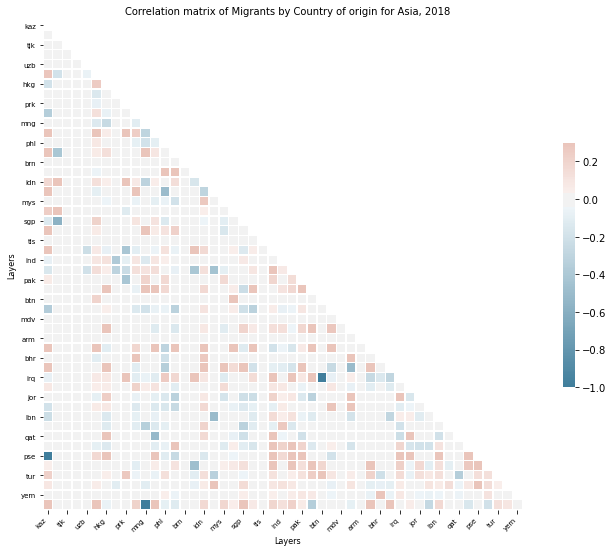

Central_Asia ['kaz', 'kgz', 'tjk', 'tkm', 'uzb']
['kaz', 'kgz', 'uzb', 'tjk', 'tkm']


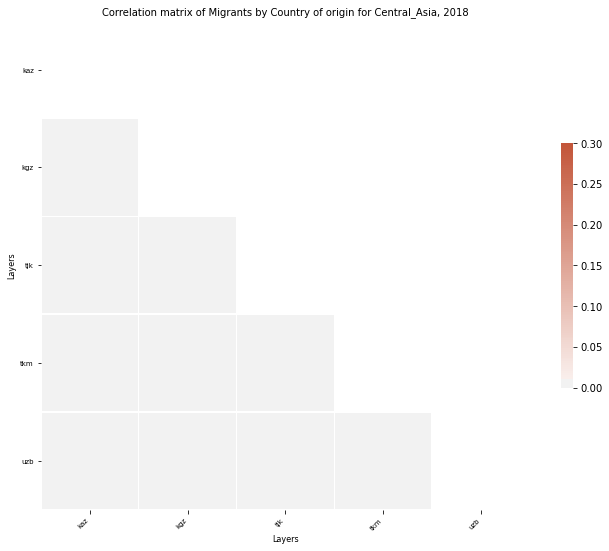

Eastern_Asia ['chn', 'hkg', 'mac', 'prk', 'jpn', 'mng', 'kor']
['hkg', 'jpn', 'mac', 'mng', 'prk', 'kor', 'chn']


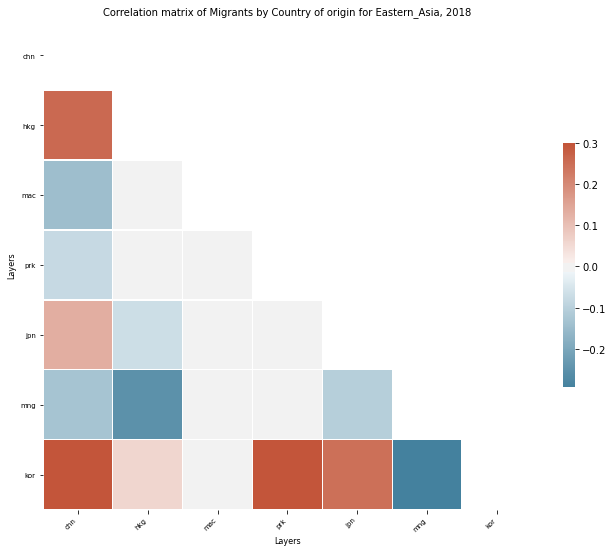

Southern-Eastern_Asia ['phl', 'vnm', 'brn', 'khm', 'idn', 'lao', 'mys', 'mmr', 'sgp', 'tha', 'tls']
['brn', 'khm', 'phl', 'idn', 'lao', 'mys', 'sgp', 'tha', 'vnm', 'mmr']


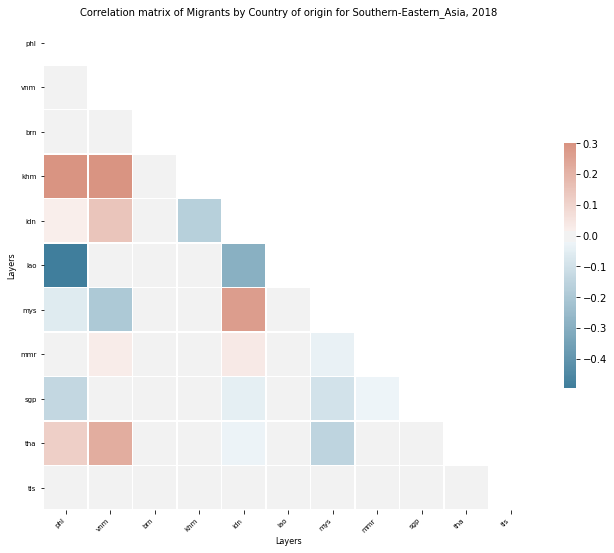

Southern_Asia ['afg', 'ind', 'irn', 'pak', 'bgd', 'btn', 'npl', 'mdv', 'lka']
['afg', 'bgd', 'btn', 'ind', 'irn', 'mdv', 'npl', 'pak', 'lka']


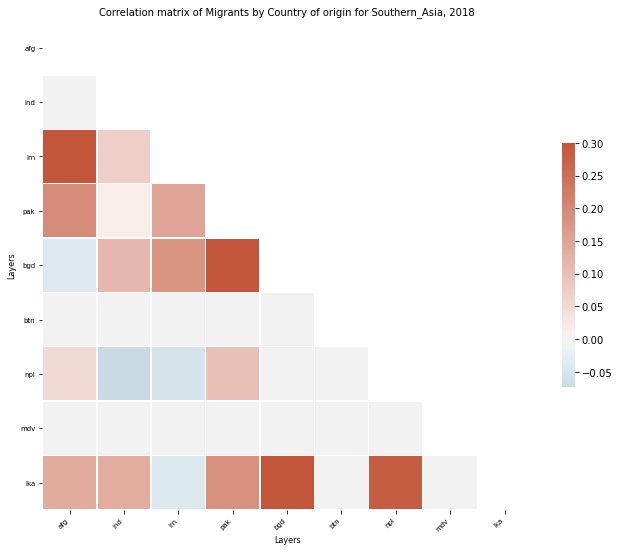

Western_Asia ['arm', 'aze', 'bhr', 'geo', 'irq', 'isr', 'jor', 'kwt', 'lbn', 'omn', 'qat', 'sau', 'pse', 'syr', 'tur', 'are', 'yem', 'cyp']
['arm', 'aze', 'bhr', 'cyp', 'geo', 'irq', 'isr', 'jor', 'kwt', 'lbn', 'omn', 'pse', 'qat', 'sau', 'syr', 'tur', 'yem', 'are']


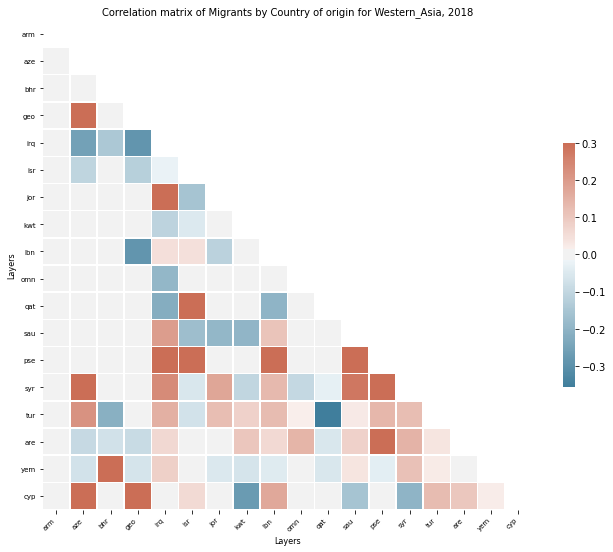

Antarctica ['ata']
[]
C:\Users\NM12LQ\Anaconda3\envs\popnet_env\lib\site-packages\seaborn\matrix.py:203: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)


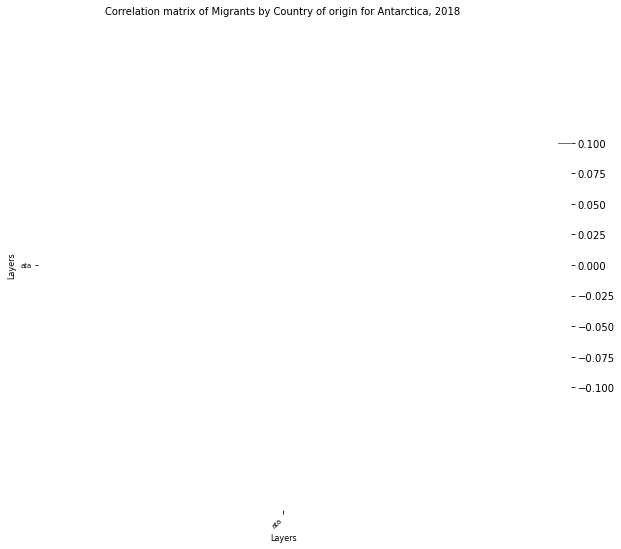

Americas ['bmu', 'can', 'grl', 'spm', 'usa', 'aia', 'atg', 'abw', 'bhs', 'brb', 'bes', 'vgb', 'cym', 'cub', 'cuw', 'dma', 'dom', 'grd', 'glp', 'hti', 'jam', 'mtq', 'msr', 'pri', 'blm', 'kna', 'lca', 'maf', 'vct', 'sxm', 'tto', 'tca', 'vir', 'blz', 'cri', 'slv', 'gtm', 'hnd', 'mex', 'nic', 'pan', 'arg', 'bol', 'bvt', 'bra', 'chl', 'col', 'ecu', 'flk', 'guf', 'guy', 'pry', 'per', 'sgs', 'sur', 'ury', 'ven']
['aia', 'atg', 'arg', 'abw', 'bhs', 'brb', 'blz', 'bmu', 'bol', 'bra', 'vgb', 'can', 'cym', 'chl', 'col', 'cri', 'cub', 'cuw', 'dma', 'dom', 'ecu', 'slv', 'flk', 'guf', 'grd', 'grl', 'glp', 'gtm', 'guy', 'hti', 'hnd', 'jam', 'mtq', 'mex', 'nic', 'pan', 'pry', 'per', 'pri', 'kna', 'lca', 'maf', 'sur', 'tto', 'ury', 'ven', 'usa', 'vct']


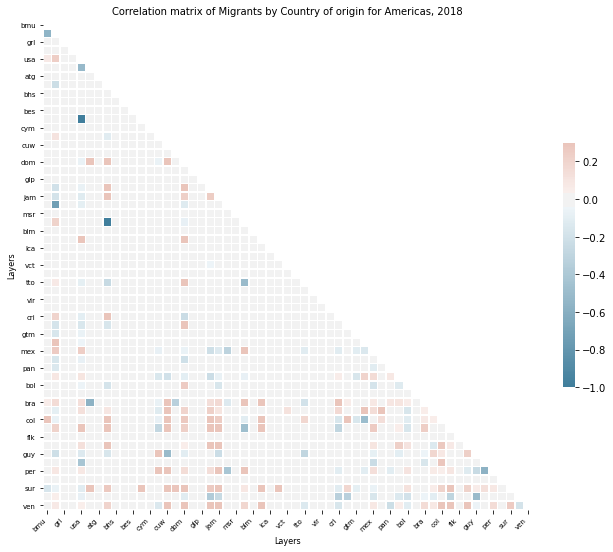

Northern_America ['bmu', 'can', 'grl', 'spm', 'usa']
['bmu', 'can', 'grl', 'usa']


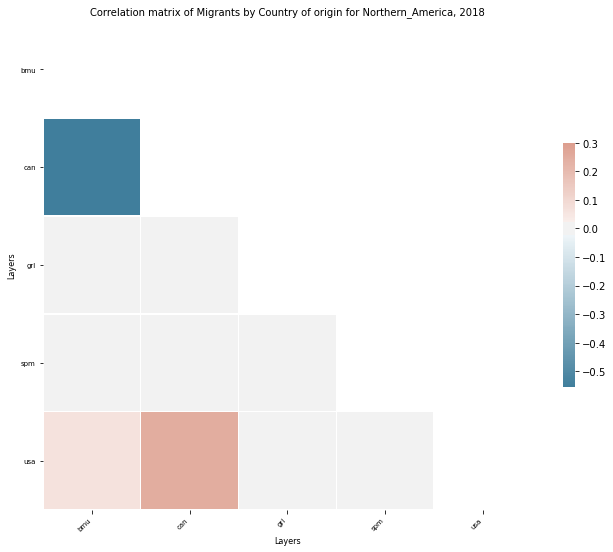

Latin_America_and_the_Caribbean ['aia', 'atg', 'abw', 'bhs', 'brb', 'bes', 'vgb', 'cym', 'cub', 'cuw', 'dma', 'dom', 'grd', 'glp', 'hti', 'jam', 'mtq', 'msr', 'pri', 'blm', 'kna', 'lca', 'maf', 'vct', 'sxm', 'tto', 'tca', 'vir', 'blz', 'cri', 'slv', 'gtm', 'hnd', 'mex', 'nic', 'pan', 'arg', 'bol', 'bvt', 'bra', 'chl', 'col', 'ecu', 'flk', 'guf', 'guy', 'pry', 'per', 'sgs', 'sur', 'ury', 'ven']
['aia', 'atg', 'arg', 'abw', 'bhs', 'brb', 'blz', 'bol', 'bra', 'vgb', 'cym', 'chl', 'col', 'cri', 'cub', 'cuw', 'dma', 'dom', 'ecu', 'slv', 'flk', 'guf', 'grd', 'glp', 'gtm', 'guy', 'hti', 'hnd', 'jam', 'mtq', 'mex', 'nic', 'pan', 'pry', 'per', 'pri', 'kna', 'lca', 'maf', 'sur', 'tto', 'ury', 'ven', 'vct']


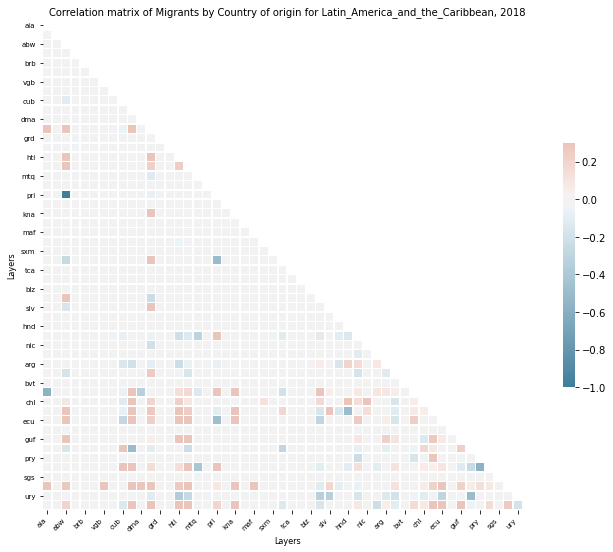

Africa ['mar', 'dza', 'egy', 'lby', 'sdn', 'tun', 'esh', 'cmr', 'som', 'nga', 'sen', 'iot', 'bdi', 'com', 'dji', 'eri', 'eth', 'atf', 'ken', 'mdg', 'mwi', 'mus', 'myt', 'moz', 'reu', 'rwa', 'syc', 'ssd', 'uga', 'tza', 'zmb', 'zwe', 'ago', 'caf', 'tcd', 'cog', 'cod', 'gnq', 'gab', 'stp', 'bwa', 'swz', 'lso', 'nam', 'zaf', 'ben', 'bfa', 'cpv', 'civ', 'gmb', 'gha', 'gin', 'gnb', 'lbr', 'mli', 'mrt', 'ner', 'shn', 'sle', 'tgo']
['dza', 'ago', 'ben', 'bwa', 'bfa', 'bdi', 'caf', 'com', 'cog', 'dji', 'egy', 'gnq', 'eri', 'eth', 'gab', 'gmb', 'gha', 'gin', 'gnb', 'civ', 'cmr', 'lso', 'lbr', 'lby', 'mdg', 'mwi', 'mli', 'mar', 'mrt', 'mus', 'myt', 'moz', 'nam', 'ner', 'nga', 'reu', 'rwa', 'stp', 'sen', 'syc', 'sle', 'sdn', 'swz', 'tza', 'tgo', 'tcd', 'tun', 'uga', 'zmb', 'zwe', 'zaf', 'ssd', 'cod', 'ken', 'som', 'cpv']


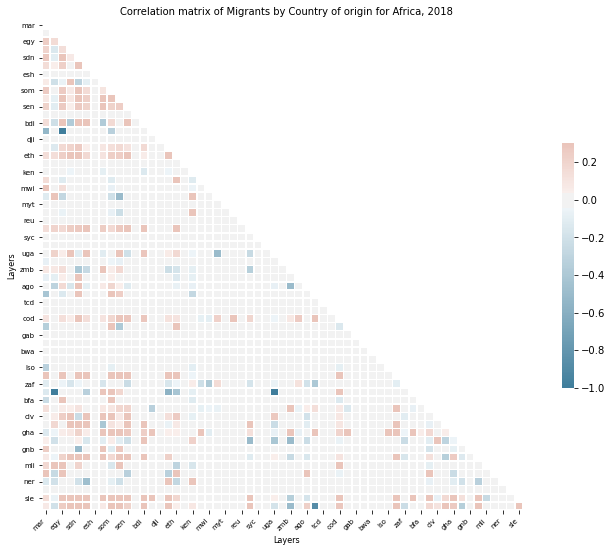

Northern_Africa ['mar', 'dza', 'egy', 'lby', 'sdn', 'tun', 'esh']
['dza', 'egy', 'lby', 'mar', 'sdn', 'tun']


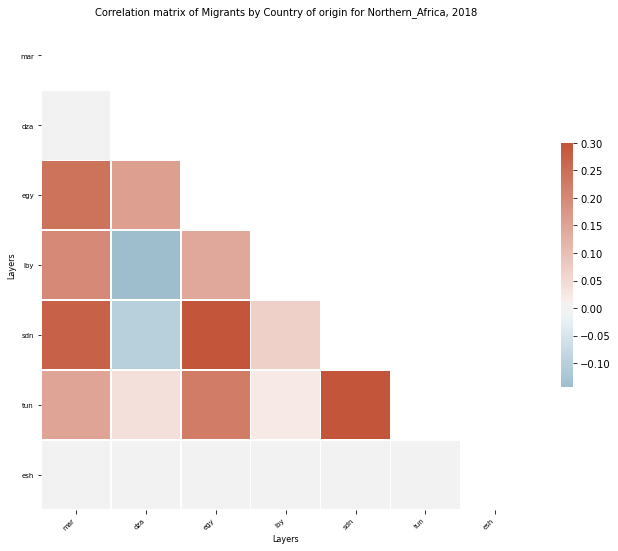

Sub-Saharan_Africa ['cmr', 'som', 'nga', 'sen', 'iot', 'bdi', 'com', 'dji', 'eri', 'eth', 'atf', 'ken', 'mdg', 'mwi', 'mus', 'myt', 'moz', 'reu', 'rwa', 'syc', 'ssd', 'uga', 'tza', 'zmb', 'zwe', 'ago', 'caf', 'tcd', 'cog', 'cod', 'gnq', 'gab', 'stp', 'bwa', 'swz', 'lso', 'nam', 'zaf', 'ben', 'bfa', 'cpv', 'civ', 'gmb', 'gha', 'gin', 'gnb', 'lbr', 'mli', 'mrt', 'ner', 'shn', 'sle', 'tgo']
['ago', 'ben', 'bwa', 'bfa', 'bdi', 'caf', 'com', 'cog', 'dji', 'gnq', 'eri', 'eth', 'gab', 'gmb', 'gha', 'gin', 'gnb', 'civ', 'cmr', 'lso', 'lbr', 'mdg', 'mwi', 'mli', 'mrt', 'mus', 'myt', 'moz', 'nam', 'ner', 'nga', 'reu', 'rwa', 'stp', 'sen', 'syc', 'sle', 'swz', 'tza', 'tgo', 'tcd', 'uga', 'zmb', 'zwe', 'zaf', 'ssd', 'cod', 'ken', 'som', 'cpv']


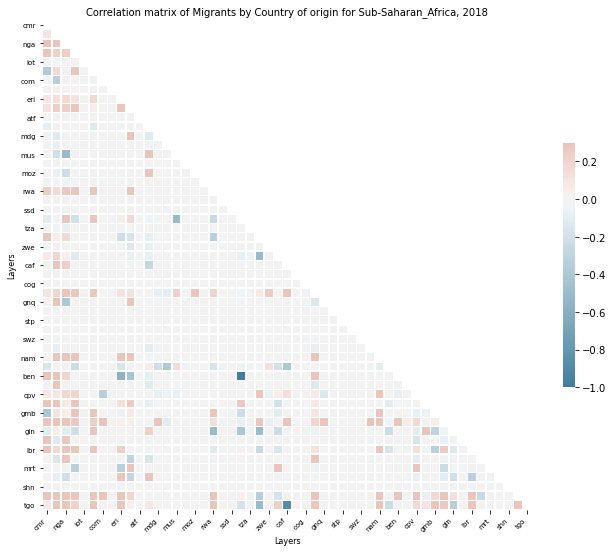

OutsideEurope ['aus', 'cxr', 'cck', 'hmd', 'nzl', 'nfk', 'fji', 'png', 'slb', 'vut', 'ncl', 'gum', 'kir', 'mhl', 'fsm', 'nru', 'mnp', 'plw', 'umi', 'asm', 'cok', 'pyf', 'niu', 'pcn', 'wsm', 'tkl', 'ton', 'tuv', 'wlf', 'kaz', 'kgz', 'tjk', 'tkm', 'uzb', 'chn', 'hkg', 'mac', 'prk', 'jpn', 'mng', 'kor', 'phl', 'vnm', 'brn', 'khm', 'idn', 'lao', 'mys', 'mmr', 'sgp', 'tha', 'tls', 'afg', 'ind', 'irn', 'pak', 'bgd', 'btn', 'npl', 'mdv', 'lka', 'arm', 'aze', 'bhr', 'geo', 'irq', 'isr', 'jor', 'kwt', 'lbn', 'omn', 'qat', 'sau', 'pse', 'syr', 'tur', 'are', 'yem', 'cyp', 'bmu', 'can', 'grl', 'spm', 'usa', 'aia', 'atg', 'abw', 'bhs', 'brb', 'bes', 'vgb', 'cym', 'cub', 'cuw', 'dma', 'dom', 'grd', 'glp', 'hti', 'jam', 'mtq', 'msr', 'pri', 'blm', 'kna', 'lca', 'maf', 'vct', 'sxm', 'tto', 'tca', 'vir', 'blz', 'cri', 'slv', 'gtm', 'hnd', 'mex', 'nic', 'pan', 'arg', 'bol', 'bvt', 'bra', 'chl', 'col', 'ecu', 'flk', 'guf', 'guy', 'pry', 'per', 'sgs', 'sur', 'ury', 'ven', 'mar', 'dza', 'egy', 'lby', 'sdn'

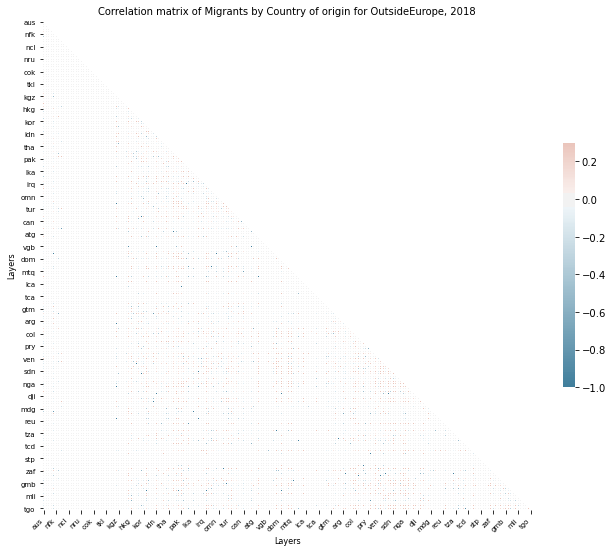

Others ['oth', 'unk', 'othe', 'urs', 'otham', 'yug', 'othaf', 'cenam', 'nstd', 'othme', 'othas', 'scg', 'tch', 'othna', 'sta']
['yug', 'oth']


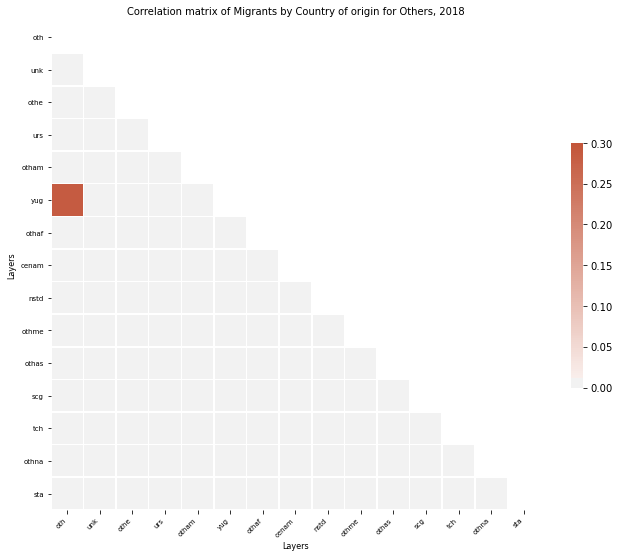

Colonies ['ukcol', 'belcol', 'prtcol', 'nldcol', 'fracol']
['ukcol', 'belcol', 'prtcol', 'nldcol', 'fracol']


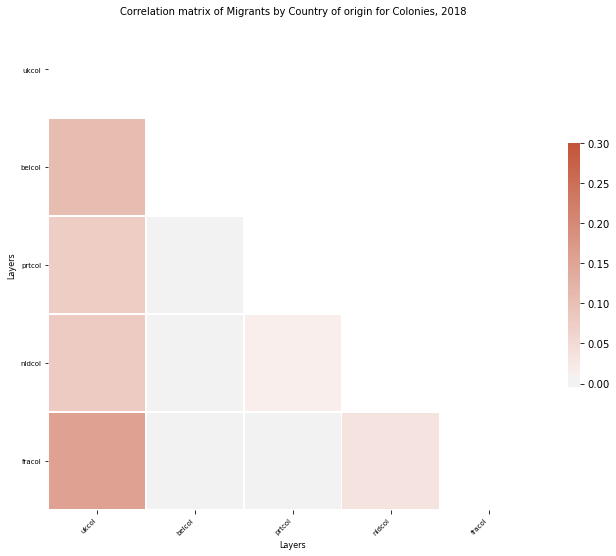

In [14]:
year=2018
df = gpd.read_file(ancillary_POPdata_folder_path + '/{0}/temp_shp/{0}_dataVectorGrid.geojson'.format(year))
for key in country_Orig:
    selectList =country_Orig['{}'.format(key)]
    print(key, selectList)   
    select = [x for x in df.columns if x in selectList]
    print(select)
    calc_cor(ancillary_POPdata_folder_path, year, df, selectList,key)

In [8]:
#Calculate correlations among regions of origin
def calc_cor(ancillary_POPdata_folder_path, year, df, selectList, key):        
    frame = pd.DataFrame(df, columns=selectList)
    
    cor = frame.corr(method='pearson')
    cor = cor.replace(np.nan, 0)
    
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(cor, dtype=bool))
    
    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(cor, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})  

    plt.title("Correlation matrix of Migrants by Country of origin for {0}, {1}".format(key,year),fontsize=10)
    plt.xlabel("Layers", fontsize=8)
    plt.ylabel("Layers", fontsize=8)
    plt.xticks(fontsize=7, rotation=45, ha='right')
    plt.yticks(fontsize=7, rotation=0)
    plt.savefig(cor_path + "/{0}_corMatrix_{1}.png".format(year,key), dpi=300)
    plt.show()